In [1]:
%config InlineBackend.figure_format = 'retina'

from matplotlib import rcParams
rcParams['savefig.dpi'] = 100
rcParams['figure.dpi'] = 100
rcParams['font.size'] = 20


import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import emcee
import arviz as az
import numpyro
import numpyro.distributions as dist
from jax import random
from numpyro.infer import mcmc, NUTS
from scipy.stats import norm
from chainconsumer import Chain, ChainConsumer, Truth, ChainConfig, PlotConfig
import tqdm


#Constantes
k2 = 8*np.pi*6.67e-11
exp = np.exp
pi = np.pi
ln = np.log

/usr/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def Omega_m(z):
    Om_0 = Omega_m0*(1+z)**3
    return Om_0

#Modelo Interagente

def H_Inter1(z, H0, Omega_m0, epsilon):
    Omega_L0 = 1 - Omega_m0
    H_interagente = H0*(Omega_m0*((1.0 + z)**(3.0 - epsilon) + (epsilon/(3.0 - epsilon))*((1.0+z)**(3.0 - epsilon)-1.0))+ Omega_L0)**(1/2)
    return H_interagente

#Não USAR
def H_Inter2(z, H0, Omega_m0, omega, alpha):
    Omega_L0 = 1 - Omega_m0
    H_interagente = H0*(Omega_m0*((1+z)**(3 - 3*omega - alpha) + ((3*omega - alpha)/(3 - 3*omega - alpha))*((1+z)**(3 - 3*omega - alpha)-1))+ Omega_L0)**(1/2)

In [3]:
#68.173
Omega_m0 = 0.343
Epsilon =  0.184

In [4]:
H_Inter1(0.0, 68.173, 0.343, 0.184)

68.173

In [6]:
print(H_Inter1(0.0, 69.5957, 0.2920, 0.0274)) #Modelo pouco sensível ao parâmetro epsilon.
print(H_Inter1(0.0, 69.5957, 0.2920, 0.184))

69.5957
69.5957


In [7]:
#Dataframe

myfile_H = pd.read_csv(r'H(z).txt', header= None, sep='\s\s+', engine='python')
myfile_H.columns = ['z', 'H', 'error_H']
Hdata = pd.DataFrame(myfile_H)
print(Hdata)

zdados = Hdata['z']
Hdados = Hdata['H']
errodado = Hdata['error_H']

         z      H  error_H
0   0.0700   69.0     19.6
1   0.0900   69.0     12.0
2   0.1200   68.6     26.2
3   0.1700   83.0      8.0
4   0.1790   75.0      4.0
5   0.1990   75.0      5.0
6   0.2000   72.9     29.6
7   0.2700   77.0     14.0
8   0.2800   88.8     36.6
9   0.3520   83.0     14.0
10  0.3802   83.0     13.5
11  0.4000   95.0     17.0
12  0.4004   77.0     10.2
13  0.4247   87.1     11.2
14  0.4497   92.8     12.9
15  0.4700   89.0     49.6
16  0.4783   80.9      9.0
17  0.4800   97.0     62.0
18  0.5930  104.0     13.0
19  0.6800   92.0      8.0
20  0.7810  105.0     12.0
21  0.8750  125.0     17.0
22  0.8800   90.0     40.0
23  0.9000  117.0     23.0
24  1.0370  154.0     20.0
25  1.3000  168.0     17.0
26  1.3630  160.0     33.6
27  1.4300  177.0     18.0
28  1.5300  140.0     14.0
29  1.7500  202.0     40.0
30  1.9650  186.5     50.4


<>:3: SyntaxWarning: invalid escape sequence '\s'
<>:3: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_3613/2300691406.py:3: SyntaxWarning: invalid escape sequence '\s'
  myfile_H = pd.read_csv(r'H(z).txt', header= None, sep='\s\s+', engine='python')


In [9]:
#Parâmetros fixos true
H0_true = 67.66
Omega_m0_true = 0.311
epsilon_true = -0.1
erroz = errodado.values

(Text(0.5, 0, '$z$'), Text(0, 0.5, '$H(z)$'))

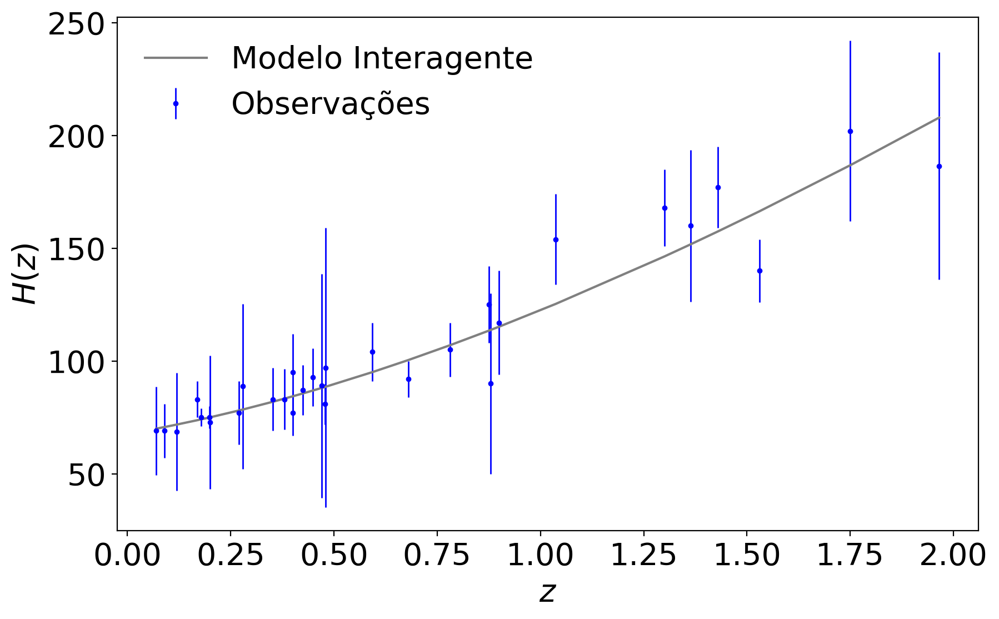

In [10]:
fig, ax = plt.subplots(figsize = (10,6))
ax.errorbar(zdados, Hdados, yerr=errodado, fmt='.', label='Observações', c = "b",ms=5, lw=1)
ax.plot(zdados, H_Inter1(zdados, H0_true, Omega_m0_true, epsilon_true), label="Modelo Interagente", c='gray')
ax.legend(frameon=False, loc=2)
ax.set_xlabel("$z$"), ax.set_ylabel("$H(z)$")

Estimativa de Mínimos Quadrados
H0= 66.791 ± 2.214
Omega_m0= 59.613 ± 1.499


(Text(0.5, 0, '$z$'), Text(0, 0.5, '$H(z)$'))

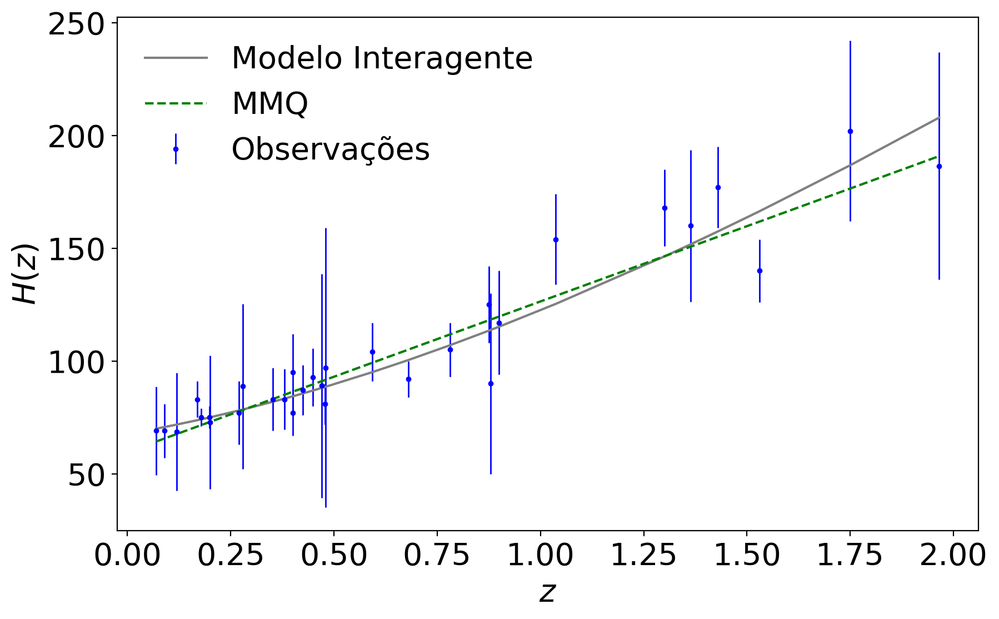

In [15]:
A = np.vander(zdados, 2)
C = np.diag(erroz*erroz)
y = H_Inter1(zdados, H0_true, Omega_m0_true, epsilon_true)

ATA = np.dot(A.T, A/(erroz*2)[:, None])
cov = np.linalg.inv(ATA)
w = np.linalg.solve(ATA, np.dot(A.T, y/(erroz*2)))
print('Estimativa de Mínimos Quadrados')
print("H0= {0:.3f} ± {1:.3f}".format(w[0], np.sqrt(cov[0,0])))
print("Omega_m0= {0:.3f} ± {1:.3f}".format(w[1], np.sqrt(cov[1,1])))
print("Epsilon= {0:.3f} ± {1:.3f}".format(w[2], np.sqrt(cov[2, 2])))

fig, ax = plt.subplots(figsize =(10,6))
ax.errorbar(zdados, Hdados, yerr=errodado, fmt='.', label='Observações',c = "b", ms=5, lw=1)
ax.plot(zdados, H_Inter1(zdados, H0_true, Omega_m0_true, epsilon_true), label="Modelo Interagente", c='gray')
ax.plot(zdados, np.dot(np.vander(zdados,2), w), "--",c = 'green',  label='MMQ')
ax.legend(frameon=False, loc=2)
ax.set_xlabel("$z$"), ax.set_ylabel("$H(z)$")


In [16]:
def log_likelihood_Free(theta, xdata, ydata, errordata):
    H0, Omega_m0, epsilon = theta
    model = H_Inter1(xdata, H0, Omega_m0, epsilon)
    sigma2 = errordata**2
    chi2 = (ydata - model)**2/sigma2
    return -0.5*np.sum(chi2 + np.log(sigma2))

from scipy.optimize import minimize

np.random.seed(42)
nll = lambda *args: - log_likelihood_Free(*args)
initial = np.array([70, 0.2, 0.3])
soln = minimize(nll, initial, args=(zdados, Hdados, errodado))
H0_LH, Omega_m_LH, epislon_LH = soln.x

print("Estimativa de Máxima Verossimilhança: ")
print("Chute Inicial: ", initial)
print("H0 LH: ", H0_LH, "Omega_m_LH: ", Omega_m_LH, "e_LH: ", epislon_LH)


Estimativa de Máxima Verossimilhança: 
Chute Inicial:  [70.   0.2  0.3]
H0 LH:  68.48213815282494 Omega_m_LH:  0.3035996505922371 e_LH:  -0.07099147128439172


In [17]:
def log_likelihood(theta, x, y, yerr):
    H0, Omega_m0, epsilon = theta
    model = H_Inter1(x, H0, Omega_m0, epsilon)
    sigma2 = yerr**2
    chi = ((y - model)**2)/sigma2
    return -0.5*np.sum((chi)+np.log(sigma2))

nll = lambda *args: - log_likelihood(*args)

initial = np.array([67.66, 0.3, 0.01])
soln = minimize(nll, initial, args=(zdados, Hdados, errodado))
H0_ml, Omega_ml, epsilon_ml = soln.x

print("Estimativa de Máxima Verossimilhança: ")
print("Chute Inicial: ", initial)
print("H0 LH: ", H0_ml, "Omega_m_LH: ", Omega_ml, "e_LH: ", epsilon_ml)


Estimativa de Máxima Verossimilhança: 
Chute Inicial:  [6.766e+01 3.000e-01 1.000e-02]
H0 LH:  68.48213973483922 Omega_m_LH:  0.30359967656611236 e_LH:  -0.07099138453154696


Máxima Verossimilhança
H0 = 68.482
Omega_m0 = 0.304
Epsilon =  -0.071


(Text(0.5, 0, '$z$'), Text(0, 0.5, '$H_0$'))

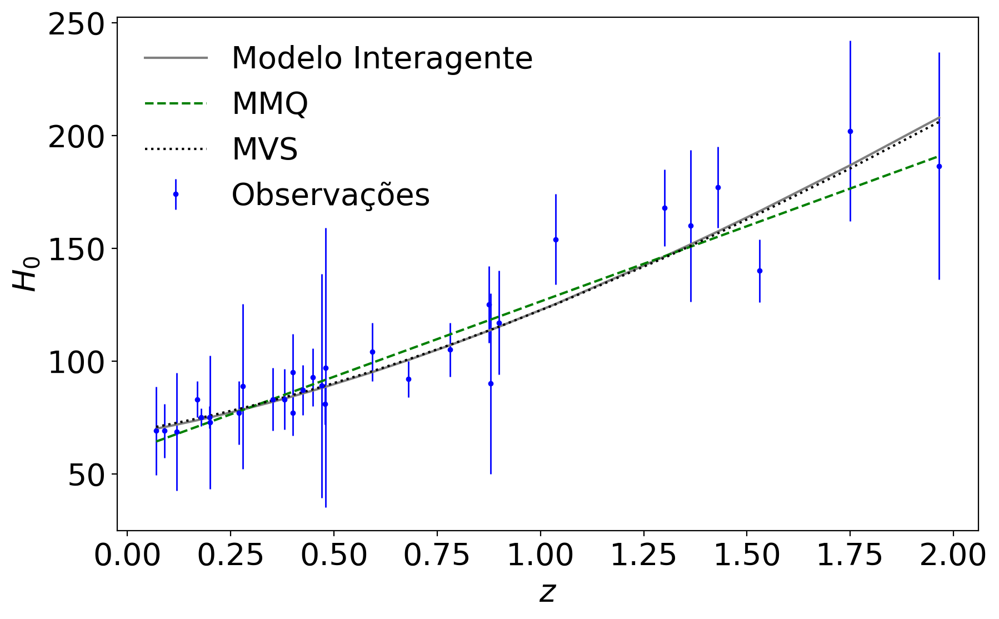

In [18]:
from scipy.optimize import minimize

def log_likelihood(theta, x, y, yerr):
    H0, Omega_m0, epsilon = theta
    model = H_Inter1(x, H0, Omega_m0, epsilon)
    sigma2 = yerr**2
    chi = ((y - model)**2)/sigma2
    return -0.5*np.sum((chi)+np.log(sigma2))

nll = lambda *args: - log_likelihood(*args)

initial = np.array([67.66, 0.3, 0.0])
soln = minimize(nll, initial, args=(zdados, Hdados, errodado))
H0_ml, Omega_ml, epsilon_ml = soln.x


print("Máxima Verossimilhança")
print("H0 = {0:.3f}".format(H0_ml))
print("Omega_m0 = {0:.3f}".format(Omega_ml))
print("Epsilon =  {0:.3f}".format(epsilon_ml))


fig, ax = plt.subplots(figsize =(10,6))
ax.errorbar(zdados, Hdados, yerr=errodado, fmt='.', label='Observações',c = "b", ms=5, lw=1)
ax.plot(zdados, H_Inter1(zdados, H0_true, Omega_m0_true, epsilon_true), label="Modelo Interagente", c='gray')
ax.plot(zdados, np.dot(np.vander(zdados,2), w), "--",c = 'green',  label='MMQ')
ax.plot(zdados, H_Inter1(zdados, H0_ml, Omega_ml, epsilon_ml), ":",c = "black", label="MVS")
ax.legend(frameon=False, loc=2)
ax.set_xlabel("$z$"), ax.set_ylabel("$H_0$")

In [19]:
def log_prior(theta): #pior seria a função de probabilidade para estimar os parâmetros?
    #H0, Omega_m0, log_alpha = theta
    H0, Omega_m0, epsilon = theta
    if 62.0 < H0 < 75.0 and 0.0 < Omega_m0 < 0.90 and -1.07 < epsilon < 1.00: #and -10.0 < log_alpha < 1.0:
        return 0.0
    return -np.inf


def log_probability(theta, x, y, yerr): #Se sim, pq eu defini uma log probibilidade aqui?
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(theta, x, y, yerr)

In [20]:
import emcee

pos = soln.x + 1e-4*np.random.randn(32, 3)
nwalkers, ndim = pos.shape #O que quer dizer esse método shape?

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_probability, args=(zdados, Hdados, errodado))
sampler.run_mcmc(pos, 10000, progress=True)

100%|██████████| 10000/10000 [09:37<00:00, 17.33it/s]


State([[ 6.21214036e+01  5.53542145e-01  2.71808204e-01]
 [ 6.32037586e+01  4.79388434e-01  4.39789263e-01]
 [ 6.83591762e+01  3.15643163e-01  1.59164402e-02]
 [ 6.28244837e+01  3.76759933e-01 -9.26707763e-03]
 [ 6.82754739e+01  3.40053061e-01  2.67683905e-02]
 [ 6.34418447e+01  5.52474681e-01  4.60576798e-01]
 [ 6.98718780e+01  2.61506470e-01 -2.66347808e-01]
 [ 7.29965047e+01  2.09363810e-01 -4.78766534e-01]
 [ 7.29262900e+01  2.10102971e-01 -1.62308031e-01]
 [ 6.78109157e+01  4.45501391e-01  8.91413310e-01]
 [ 6.61272686e+01  3.10624963e-01 -3.65868084e-02]
 [ 6.47048155e+01  4.01393558e-01  2.91772559e-01]
 [ 7.01516834e+01  2.41166179e-01 -3.54863759e-01]
 [ 6.63128740e+01  3.40205431e-01  6.76863306e-02]
 [ 6.20734042e+01  4.96280510e-01  8.43814147e-02]
 [ 6.90390480e+01  2.32941559e-01 -6.32389527e-01]
 [ 6.98159546e+01  2.18413560e-01 -3.66715021e-01]
 [ 7.12221573e+01  2.15620941e-01 -2.70966585e-01]
 [ 6.37226050e+01  5.33071203e-01  8.88483462e-01]
 [ 7.05133187e+01  2.4770

In [21]:
H0_chain = sampler.get_chain()
Omega_m_chain = sampler.get_chain()
epsilon_chain = sampler.get_chain()

np.save("./H0_chain.npy", H0_chain)
np.save("./Omega_m_chain.npy", Omega_m_chain)
np.save("./epsilon_chain.npy", epsilon_chain)

#Teste de dimensões das cadeiras
print(epsilon_chain[:, :, 0].flatten().shape)



(320000,)


In [22]:
print("Cadeia para H0: ")
print(H0_chain)

Cadeia para H0: 
[[[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822915e+01  3.03569606e-01 -7.10014042e-02]
  [ 6.84823767e+01  3.03702724e-01 -7.10621625e-02]
  ...
  [ 6.84822331e+01  3.03525087e-01 -7.08832635e-02]
  [ 6.84822251e+01  3.03774344e-01 -7.11416253e-02]
  [ 6.84821370e+01  3.03583276e-01 -7.11773768e-02]]

 [[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822960e+01  3.03577982e-01 -7.10017198e-02]
  [ 6.84825361e+01  3.03807223e-01 -7.11192773e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84822453e+01  3.03741532e-01 -7.12452035e-02]
  [ 6.84821129e+01  3.03672859e-01 -7.11909329e-02]]

 [[ 6.84822718e+01  3.03848216e-01 -7.06938657e-02]
  [ 6.84823044e+01  3.03579886e-01 -7.09893545e-02]
  [ 6.84826105e+01  3.03857686e-01 -7.11541044e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84823382e+01  3.03706478e-01 -7.11904974e-02]
  [ 6.84820351e+01  3.03731185e-01 -7.13595976e-02]]

 ...

 [[ 6.21843802e+0

In [23]:
print("Cadeia para Omega_m: ")
print(Omega_m_chain)

Cadeia para Omega_m: 
[[[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822915e+01  3.03569606e-01 -7.10014042e-02]
  [ 6.84823767e+01  3.03702724e-01 -7.10621625e-02]
  ...
  [ 6.84822331e+01  3.03525087e-01 -7.08832635e-02]
  [ 6.84822251e+01  3.03774344e-01 -7.11416253e-02]
  [ 6.84821370e+01  3.03583276e-01 -7.11773768e-02]]

 [[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822960e+01  3.03577982e-01 -7.10017198e-02]
  [ 6.84825361e+01  3.03807223e-01 -7.11192773e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84822453e+01  3.03741532e-01 -7.12452035e-02]
  [ 6.84821129e+01  3.03672859e-01 -7.11909329e-02]]

 [[ 6.84822718e+01  3.03848216e-01 -7.06938657e-02]
  [ 6.84823044e+01  3.03579886e-01 -7.09893545e-02]
  [ 6.84826105e+01  3.03857686e-01 -7.11541044e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84823382e+01  3.03706478e-01 -7.11904974e-02]
  [ 6.84820351e+01  3.03731185e-01 -7.13595976e-02]]

 ...

 [[ 6.218438

In [24]:
print("Cadeia para Epsilon: ")
print(epsilon_chain)

Cadeia para Epsilon: 
[[[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822915e+01  3.03569606e-01 -7.10014042e-02]
  [ 6.84823767e+01  3.03702724e-01 -7.10621625e-02]
  ...
  [ 6.84822331e+01  3.03525087e-01 -7.08832635e-02]
  [ 6.84822251e+01  3.03774344e-01 -7.11416253e-02]
  [ 6.84821370e+01  3.03583276e-01 -7.11773768e-02]]

 [[ 6.84822315e+01  3.03584079e-01 -7.09342044e-02]
  [ 6.84822960e+01  3.03577982e-01 -7.10017198e-02]
  [ 6.84825361e+01  3.03807223e-01 -7.11192773e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84822453e+01  3.03741532e-01 -7.12452035e-02]
  [ 6.84821129e+01  3.03672859e-01 -7.11909329e-02]]

 [[ 6.84822718e+01  3.03848216e-01 -7.06938657e-02]
  [ 6.84823044e+01  3.03579886e-01 -7.09893545e-02]
  [ 6.84826105e+01  3.03857686e-01 -7.11541044e-02]
  ...
  [ 6.84820922e+01  3.03274773e-01 -7.10433223e-02]
  [ 6.84823382e+01  3.03706478e-01 -7.11904974e-02]
  [ 6.84820351e+01  3.03731185e-01 -7.13595976e-02]]

 ...

 [[ 6.218438

<>:16: SyntaxWarning: invalid escape sequence '\O'
<>:16: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_3613/5818432.py:16: SyntaxWarning: invalid escape sequence '\O'
  c.set_plot_config(PlotConfig(labels={"H0": "$H_0$", "Omega_m": "$\Omega_{m}$", "Epsilon": "$e$"}))


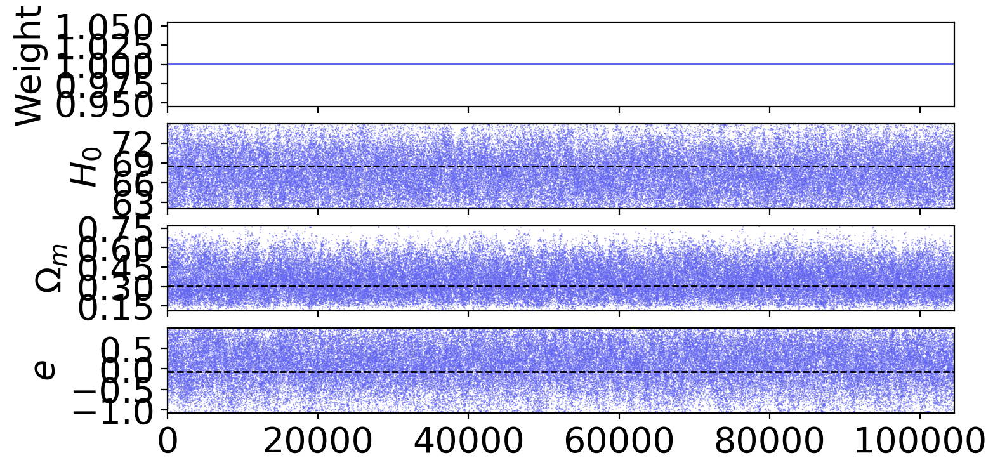

In [25]:
chain = Chain.from_emcee(
    sampler,
    columns=["H0", "Omega_m", "Epsilon"],
    name ="Cadeia",
    discard = 200,
    color='indigo',
    summary_area=0.95,
        show_contour_labels=True)


truth = Truth(location={'H0': H0_ml, 'Omega_m': Omega_ml, 'Epsilon': epsilon_ml}, color='black')
c = ChainConsumer()
c.add_chain(chain)
#consumer.add_marker(location={'H0': H0_ml, 'Omega_m': Omega_ml}, name='MLH', color='orange', marker_style='P', marker_size=50)
c.add_truth(truth)
c.set_plot_config(PlotConfig(labels={"H0": "$H_0$", "Omega_m": "$\Omega_{m}$", "Epsilon": "$e$"}))
#consumer.add_chain(sampler.chain.reshape((-1, ndim==2)), color='r')
fig = c.plotter.plot_walks(plot_weights=True,figsize=(8,4))

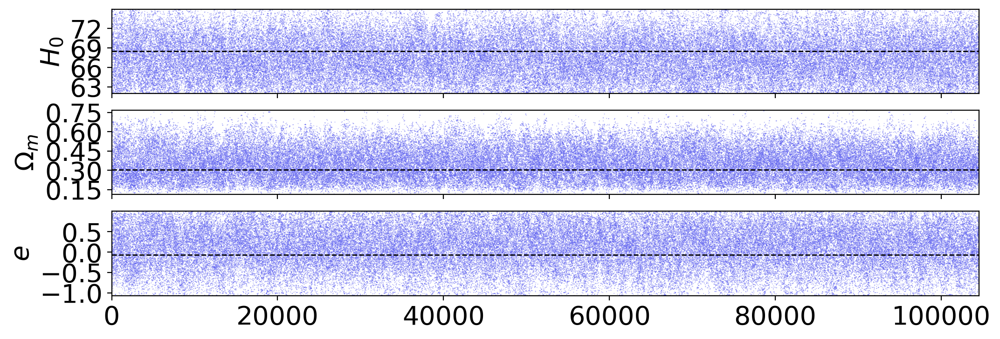

In [26]:
fig2 = c.plotter.plot_walks(plot_weights=None,figsize=(12,4))

In [27]:
c.add_marker(location={'H0': H0_ml, 'Omega_m': Omega_ml, "Epsilon": epsilon_ml}, name='MLH', color='orange', marker_style='P', marker_size=50)

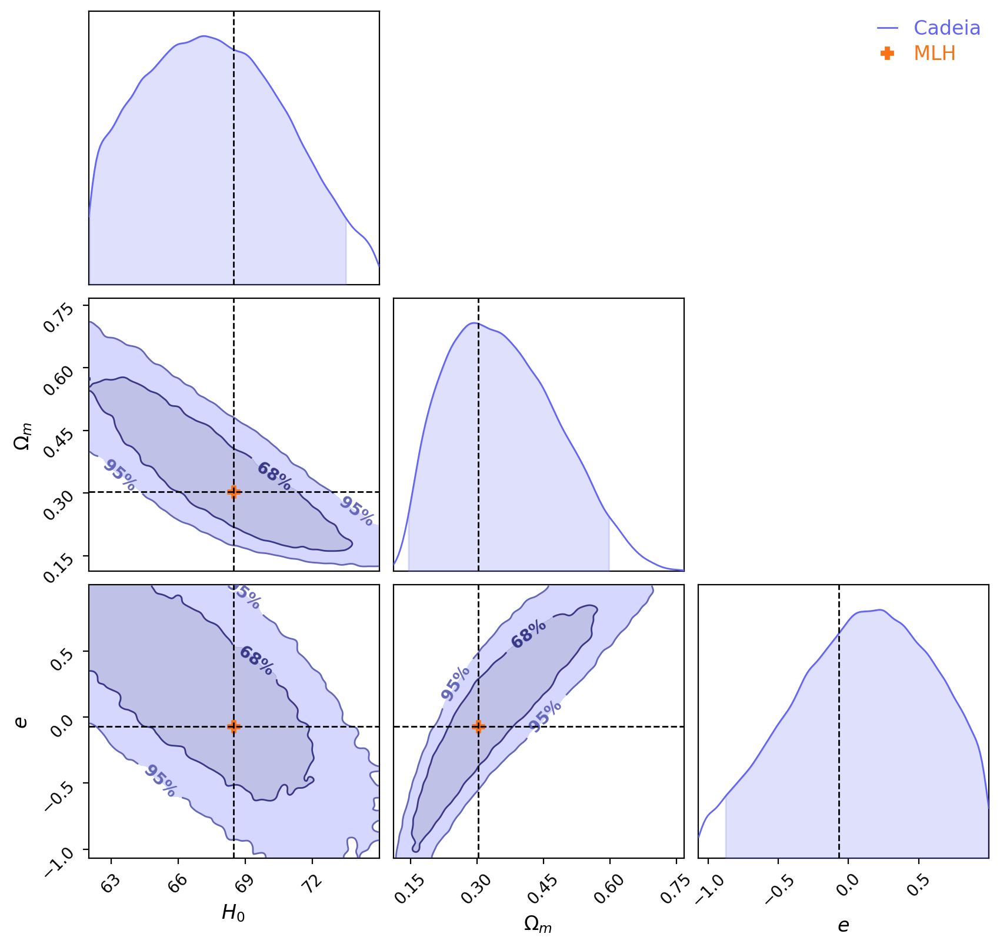

In [28]:
fig = c.plotter.plot()

In [29]:
H0_chain = np.load("H0_chain.npy")
H0_chain = H0_chain[:, :, 0].flatten()

Omega_m_chain = np.load("Omega_m_chain.npy")
Omega_m_chain = Omega_m_chain[:, :, 1].flatten()

epsilon_chain = np.load("epsilon_chain.npy")
epsilon_chain = epsilon_chain[:, :, 2].flatten()


In [56]:
print("Cadeia para Omega_m selecionada: ")
print(Omega_m_chain)

Cadeia para Omega_m selecionada: 
[0.30360578 0.30348072 0.30351768 ... 0.24583975 0.30490303 0.33521763]


In [57]:
print("Cadeia para epsilon selecionada: ")
print(epsilon_chain)

Cadeia para epsilon selecionada: 
[-0.07105995 -0.07102611 -0.0710151  ... -0.38541685 -0.36745974
  0.16945722]


In [30]:
from scipy.stats import gaussian_kde

def estimate_maxima(data):
    kde = gaussian_kde(data)
    no_samples = len(data)
    samples = np.linspace(min(data), max(data), no_samples)
    probs = kde.evaluate(samples)
    maxima_index = probs.argmax()
    maxima = samples[maxima_index]
    
    return probs, maxima

In [31]:
maximum_H0 = estimate_maxima(H0_chain)[1]
maximum_Omega_m = estimate_maxima(Omega_m_chain)[1]
maximum_epsilon = estimate_maxima(epsilon_chain)[1]


In [33]:
import seaborn as sns

probabilidades = estimate_maxima(H0_chain)[0]

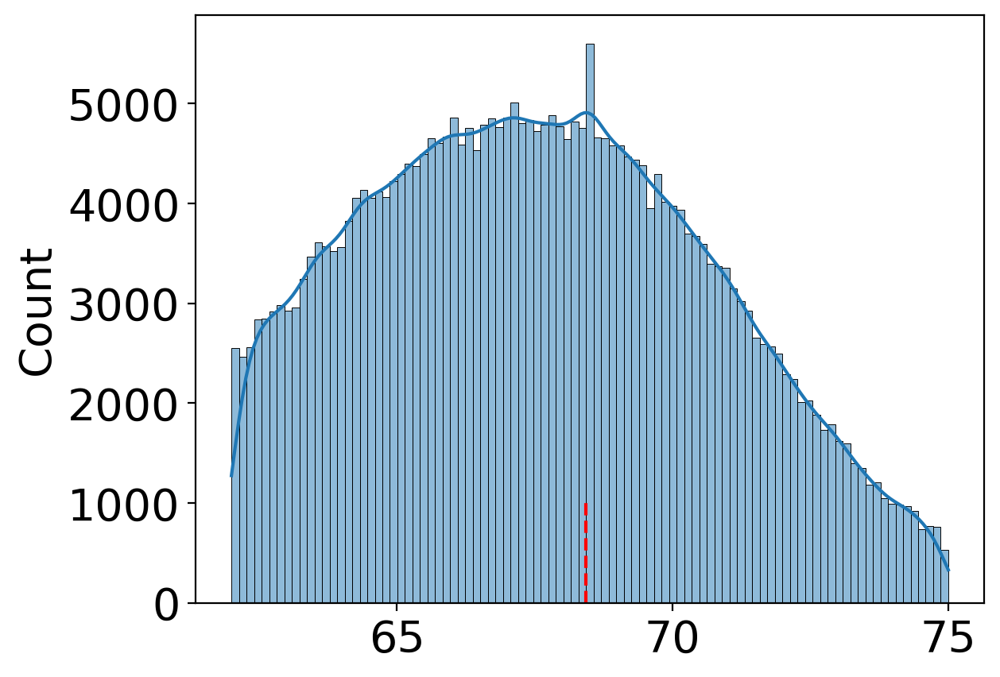

In [35]:
import seaborn as sns

sns.histplot(H0_chain, kde=True)
plt.plot([maximum_H0, maximum_H0], [0, 1000], "r--")

In [36]:
print("Pico da distribuição de H0 em: ", maximum_H0)

Pico da distribuição de H0 em:  68.43071981300504


Pico de distribuição de Omega_m:  0.3004670888170625


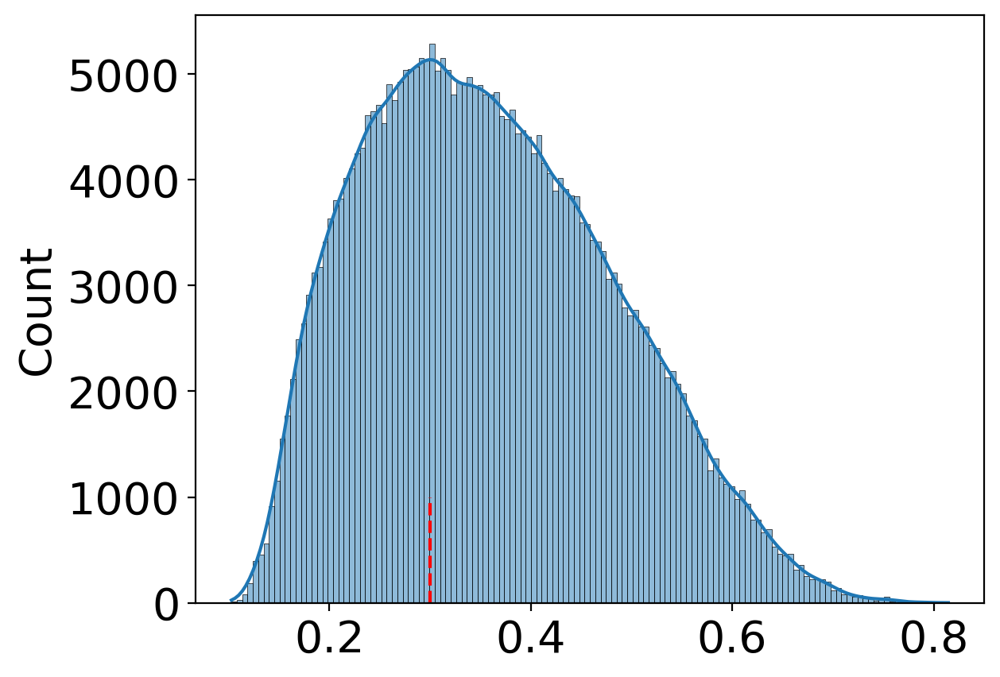

In [37]:
sns.histplot(Omega_m_chain, kde=True)
plt.plot([maximum_Omega_m, maximum_Omega_m], [0, 1000], "r--")
print("Pico de distribuição de Omega_m: ", maximum_Omega_m)

Pico de distribuição de Epsilon:  0.22691667072069532


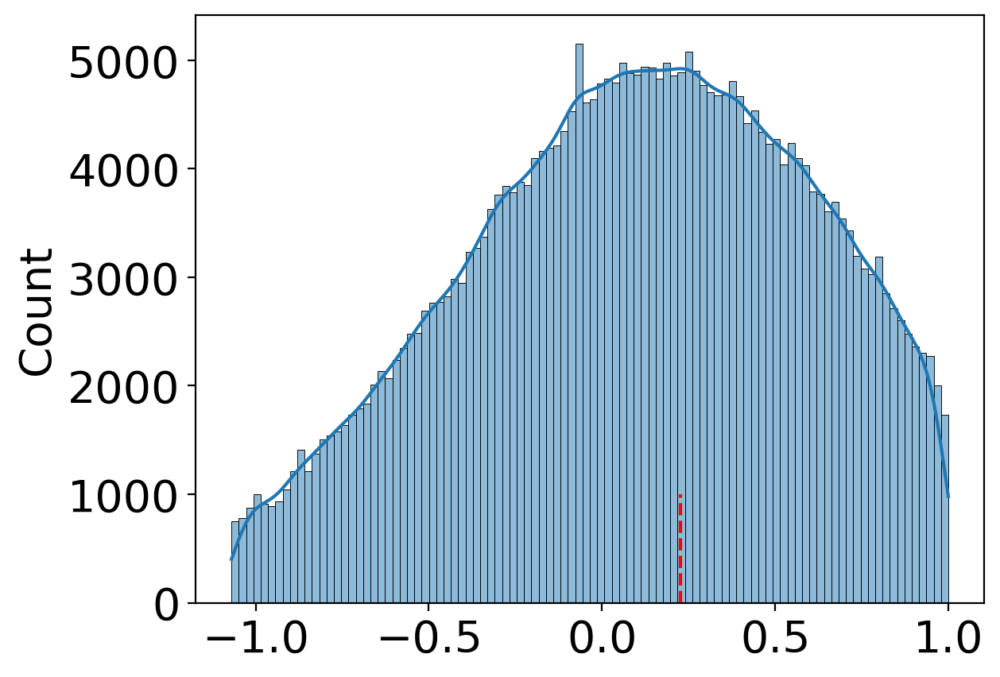

In [38]:
sns.histplot(epsilon_chain, kde=True)
plt.plot([maximum_epsilon, maximum_epsilon], [0, 1000], "r--")
print("Pico de distribuição de Epsilon: ", maximum_epsilon)

In [39]:
c.add_marker(location={'H0': maximum_H0, 'Omega_m': maximum_Omega_m, "Epsilon": maximum_epsilon}, name='Peak', color='red', marker_style='*', marker_size=50)

<>:8: SyntaxWarning: invalid escape sequence '\O'
<>:8: SyntaxWarning: invalid escape sequence '\O'
/tmp/ipykernel_3613/902467726.py:8: SyntaxWarning: invalid escape sequence '\O'
  c.set_plot_config(PlotConfig(labels={"H0": "$H_0$", "Omega_m": "$\Omega_{m}$", "Epsilon": "$e$"}))


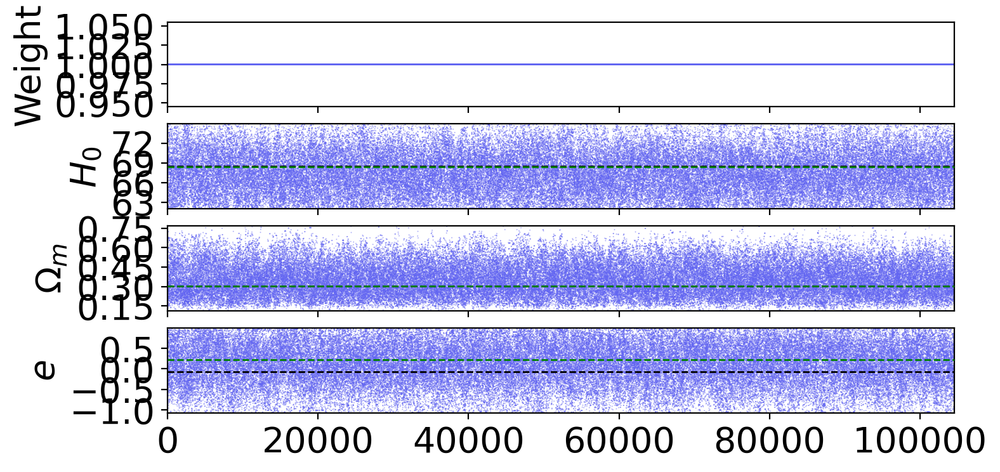

In [41]:
truth1 = Truth(location={'H0': H0_ml, 'Omega_m': Omega_ml, 'Epsilon': epsilon_ml}, color='black')
truth2 = Truth(location={'H0': maximum_H0, 'Omega_m': maximum_Omega_m, "Epsilon": maximum_epsilon}, color='green' )
c = ChainConsumer()
c.add_chain(chain)
#consumer.add_marker(location={'H0': H0_ml, 'Omega_m': Omega_ml}, name='MLH', color='orange', marker_style='P', marker_size=50)
c.add_truth(truth1)
c.add_truth(truth2)
c.set_plot_config(PlotConfig(labels={"H0": "$H_0$", "Omega_m": "$\Omega_{m}$", "Epsilon": "$e$"}))
#consumer.add_chain(sampler.chain.reshape((-1, ndim==2)), color='r')
fig = c.plotter.plot_walks(plot_weights=True,figsize=(8,4))

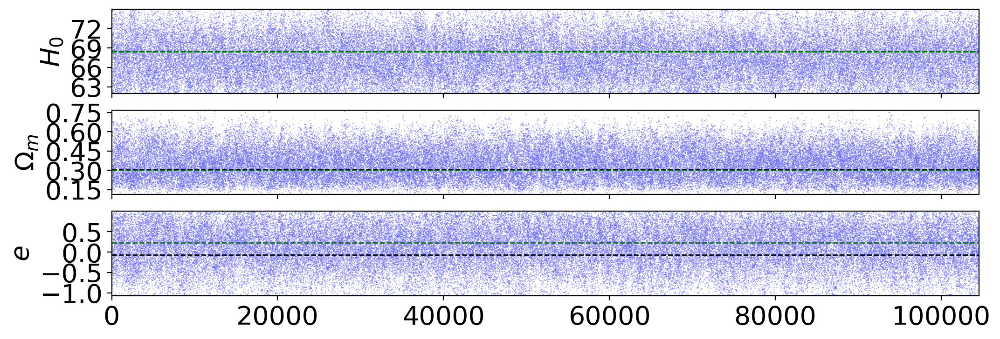

In [42]:
fig2 = c.plotter.plot_walks(plot_weights=None,figsize=(12,4))

In [44]:

c.add_marker(location={'H0': maximum_H0, 'Omega_m': maximum_Omega_m, "Epsilon": maximum_epsilon}, name='Peak', color='red', marker_style='*', marker_size=50)

In [46]:
c.add_marker(location={'H0': H0_ml, 'Omega_m': Omega_ml, "Epsilon": epsilon_ml}, name='MLH', color='orange', marker_style='P', marker_size=50)

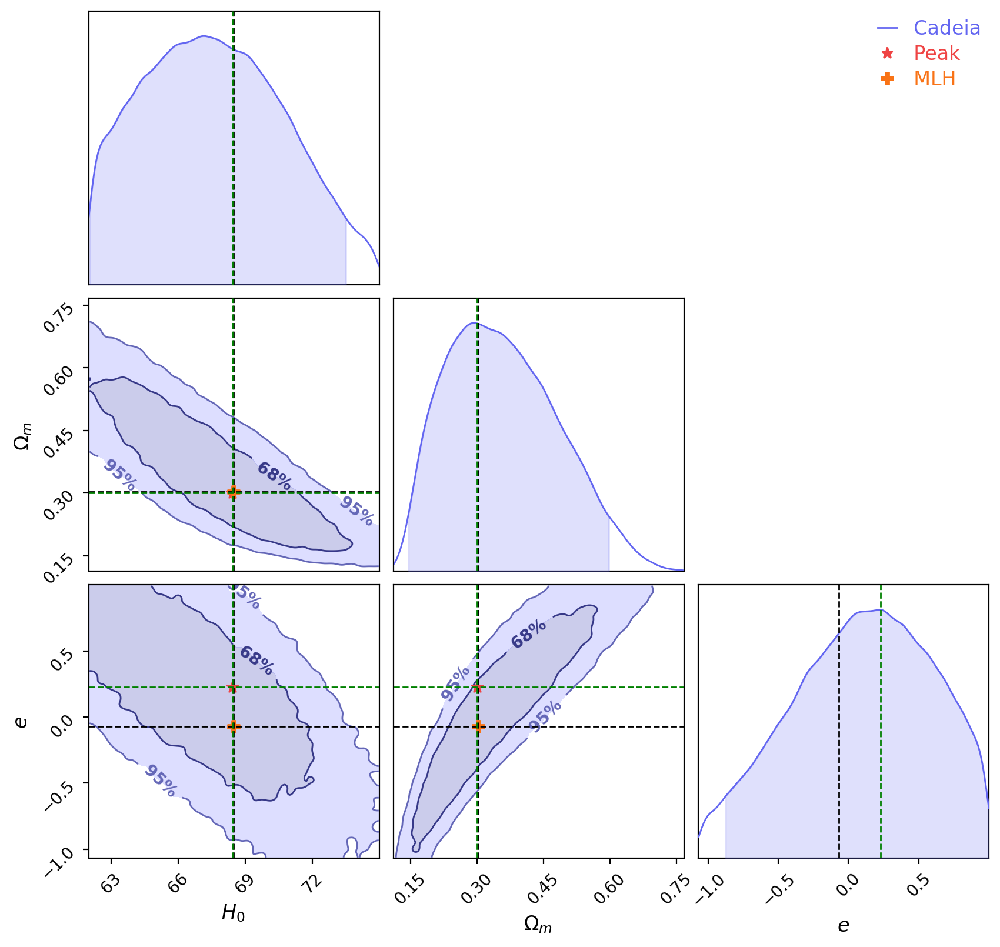

In [47]:
fig = c.plotter.plot()